In [1]:
import warnings
warnings.filterwarnings('ignore')

import mxnet as mx
import numpy as np
import gluoncv as gcv
import matplotlib.image as mpimg
import matplotlib.pyplot as plt

from mxnet import nd, image
from mxnet.gluon.data.vision import transforms
from gluoncv.model_zoo import get_model
from gluoncv.utils import viz, download

In [2]:
plt.rcParams['figure.figsize'] = (15, 9)

# Image Classification

With this one-line code, we can load a pre-trained **ResNet50_v1** model for classification.

In [3]:
ctx = mx.gpu(0)
net = gcv.model_zoo.resnet50_v1b(pretrained=True, ctx=ctx)

With another one-line code we can have our prediction.

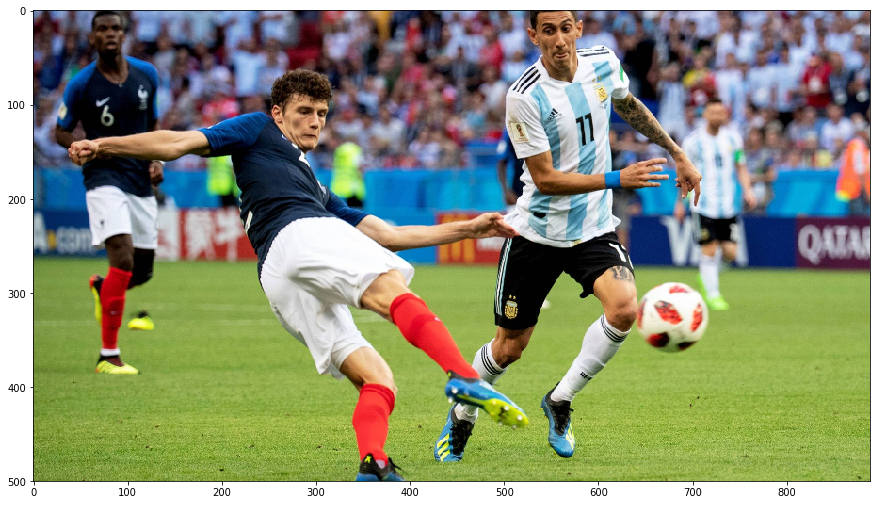

In [4]:
x, img = gcv.data.transforms.presets.ssd.load_test('support/but2.jpg', short=500)
viz.plot_image(img)

In [5]:
%%time
pred = net(x.as_in_context(ctx))
nd.waitall()

CPU times: user 300 ms, sys: 1.02 s, total: 1.32 s
Wall time: 8.84 s


Let's review the top 5 prediction results.

In [6]:
classes_fname = download('https://raw.githubusercontent.com/hetong007/gluon-cv/master/scripts/classification/imagenet/imagenet_labels.txt',
                         'imagenet_labels.txt')
with open('imagenet_labels.txt', 'r') as f:
    class_names = [l.strip('\n') for l in f.readlines()]

6KB [00:00, 3236.35KB/s]             

In [7]:
topK = 5
ind = pred.topk(k=topK).astype('int')[0]
for i in range(topK):
    print('[%s], with probability %.1f%%'%
         (class_names[ind[i].asscalar()], nd.softmax(pred)[0][ind[i]].asscalar()*100))

[rugby_ball], with probability 3.8%
[soccer_ball], with probability 2.8%
[baseball], with probability 1.5%
[ballplayer], with probability 1.4%
[football_helmet], with probability 1.2%


# Object Detection

Image classifications are trained to recognize the main object in the scene. What if we have multiple subjects?

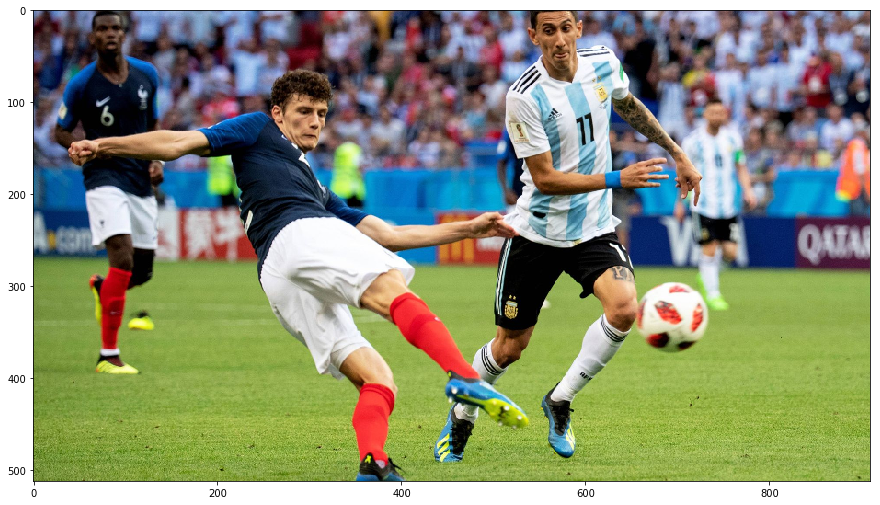

In [8]:
x, img = gcv.data.transforms.presets.ssd.load_test('support/but2.jpg', short=512)
viz.plot_image(img)
plt.show()

We can instead predict with an object detection model **SSD**.
![](https://cdn-images-1.medium.com/max/2000/1*pPxrkm4Urz04Ez65mwWE9Q.png)
![](https://i.stack.imgur.com/Z3cIS.png)

In [9]:
ctx = mx.gpu(0)
net = get_model('ssd_512_resnet50_v1_coco', pretrained=True, ctx=ctx)

Now we predict. Notice we have three output variables.

In [10]:
%%time
class_IDs, scores, bounding_boxes = net(x.as_in_context(ctx))
nd.waitall()

CPU times: user 560 ms, sys: 1.59 s, total: 2.15 s
Wall time: 13.3 s


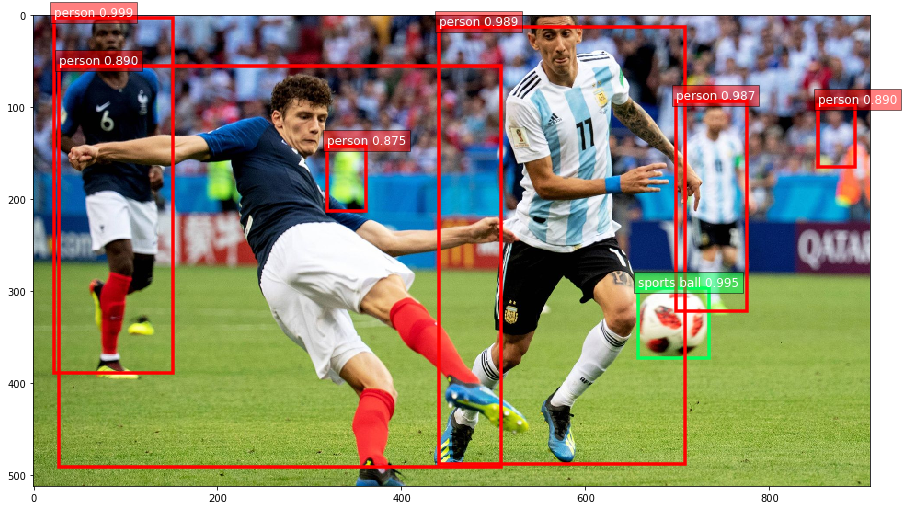

In [11]:
viz.plot_bbox(img, bounding_boxes[0], scores[0], class_IDs[0], class_names=net.classes, thresh=0.8)
plt.show()

Can be used to count people in a picture

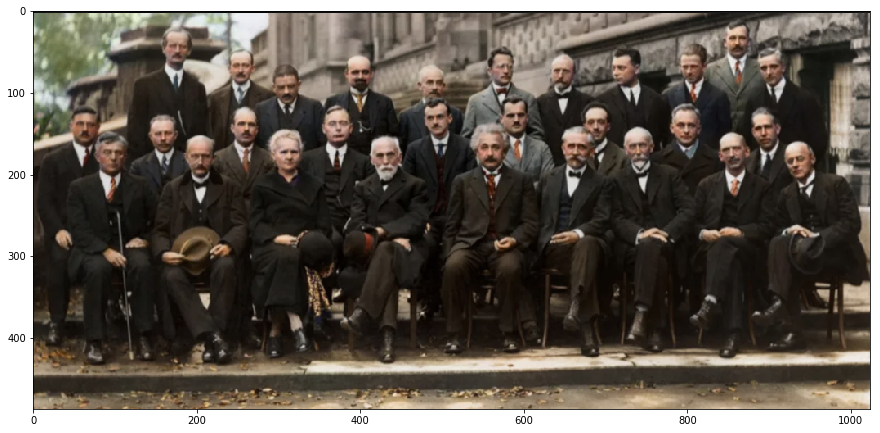

In [28]:
x, img = gcv.data.transforms.presets.ssd.load_test('support/scientists.png', short=800)
viz.plot_image(img)
plt.show()

In [29]:
class_IDs, scores, bounding_boxes = net(x.as_in_context(ctx))
person_ind = [i for i, cls in enumerate(net.classes) if cls == 'person'][0]
ind = np.nonzero(class_IDs[0].asnumpy() == person_ind)[0]

total = 0
for class_id, score  in zip(class_IDs[0].asnumpy(), scores[0].asnumpy()):
    if class_id[0] == person_ind and score[0] > 0.5:        
        total += 1

There are 28 people in this photo.


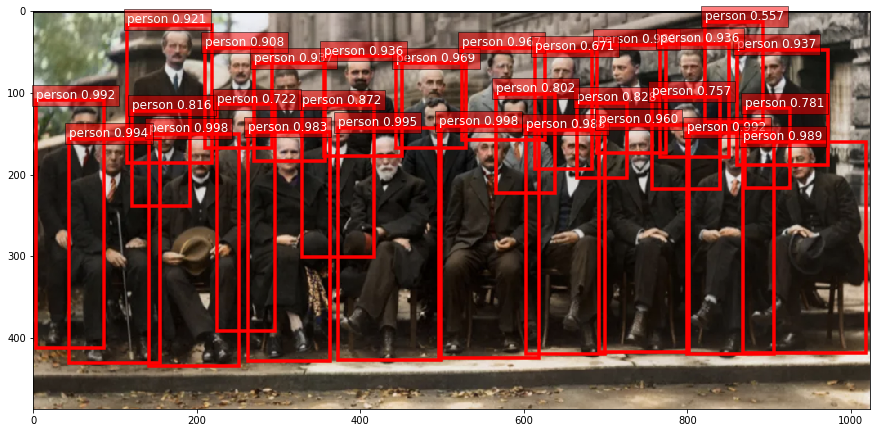

In [30]:
new_class_IDs = class_IDs[0][ind]
new_scores = scores[0][ind]
new_bounding_boxes = bounding_boxes[0][ind]

viz.plot_bbox(img, new_bounding_boxes, new_scores, new_class_IDs, class_names=net.classes, thresh=0.5)

print('There are %d people in this photo.'%total)

Another scenario, following the heating topic: automated driving.

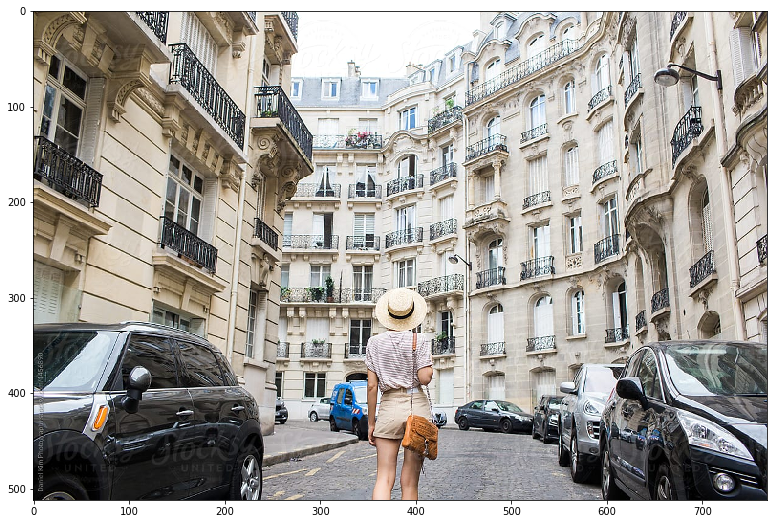

In [31]:
x, img = gcv.data.transforms.presets.ssd.load_test('support/rue.jpg', short=512)
viz.plot_image(img)
plt.show()

In [32]:
%%time
class_IDs, scores, bounding_boxs = net(x.as_in_context(ctx))

CPU times: user 56 ms, sys: 16 ms, total: 72 ms
Wall time: 122 ms


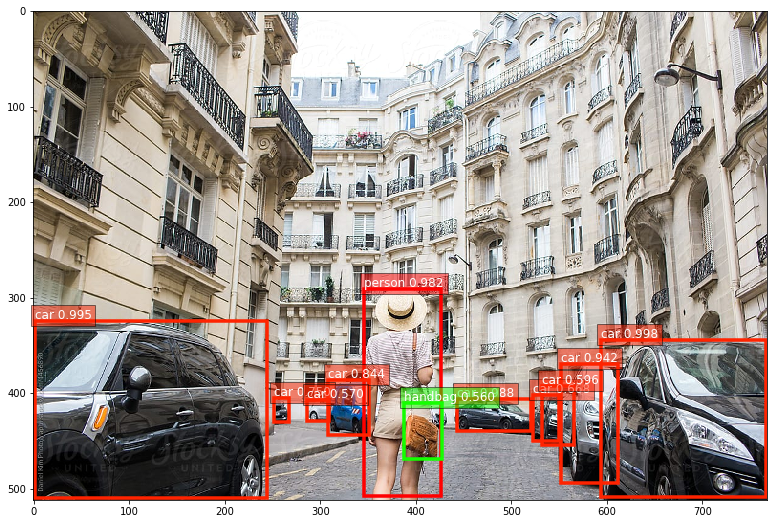

In [33]:
viz.plot_bbox(img, bounding_boxs[0], scores[0], class_IDs[0], class_names=net.classes)
plt.show()

# Semantic Segmentation

Semantic segmentation takes the concept further, by predicting the class for every pixel.

In [34]:
ctx = mx.gpu(0)
net = get_model('fcn_resnet50_ade', pretrained=True, ctx=ctx)

In [35]:
%%time
output = net.demo(x.as_in_context(ctx))
pred = output.argmax(1).asnumpy().squeeze()

CPU times: user 264 ms, sys: 724 ms, total: 988 ms
Wall time: 6.58 s


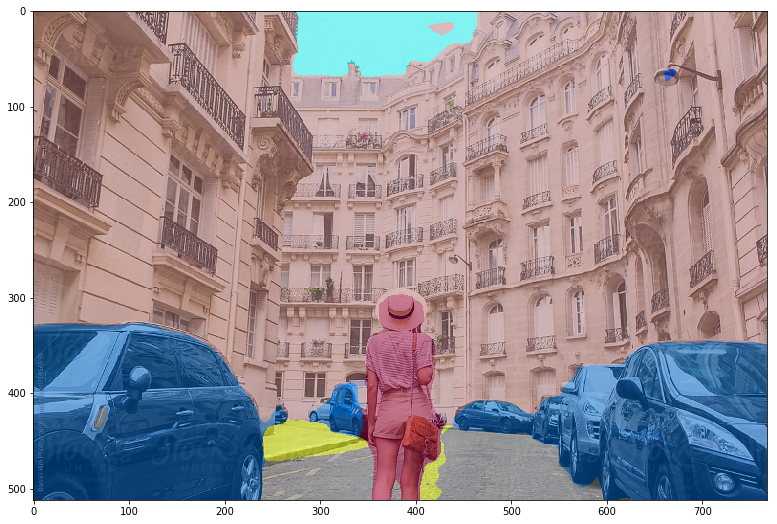

In [36]:
mask = viz.get_color_pallete(pred, 'ade20k')
mask = np.array(mask.convert('RGB'), dtype=np.int)

combined = (mask+img)/2

plt.imshow(combined.astype(np.uint8))
plt.show()

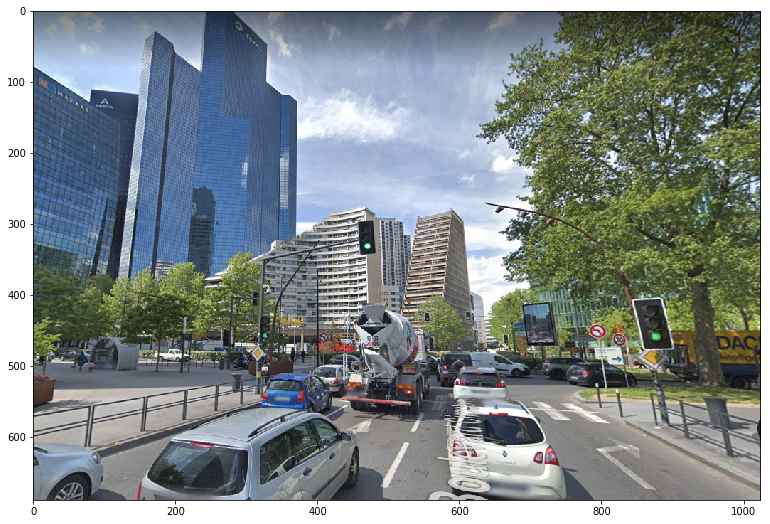

In [37]:
x, img = gcv.data.transforms.presets.ssd.load_test('support/rue3.png', short=800)
viz.plot_image(img)
plt.show()

In [38]:
%%time
output = net.demo(x.as_in_context(ctx))
pred = output.argmax(1).asnumpy().squeeze()

CPU times: user 340 ms, sys: 924 ms, total: 1.26 s
Wall time: 8.42 s


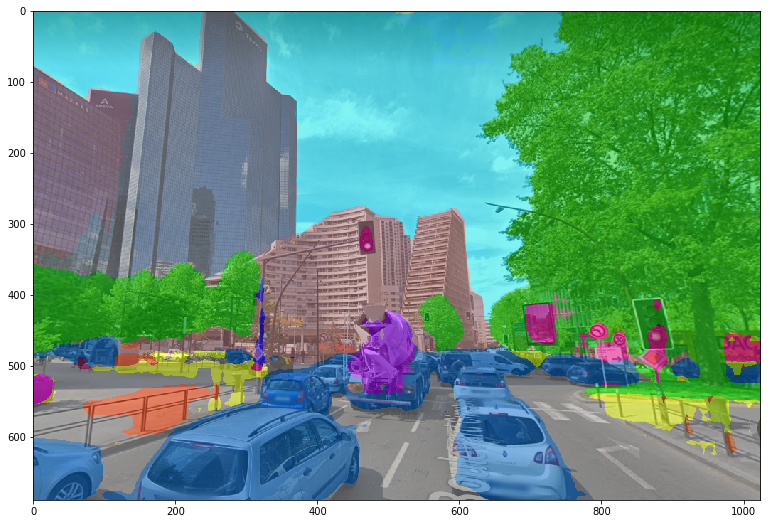

In [39]:
mask = viz.get_color_pallete(pred, 'ade20k')
mask = np.array(mask.convert('RGB'), dtype=np.int)

combined = (mask+img)/2
plt.imshow(combined.astype(np.uint8))
plt.show()

In [40]:
ctx = mx.gpu(0)
net = get_model('mask_rcnn_resnet50_v1b_coco', pretrained=True, ctx=ctx)

In [41]:
x, orig_img = gcv.data.transforms.presets.rcnn.load_test('support/rue3.png', short=800)

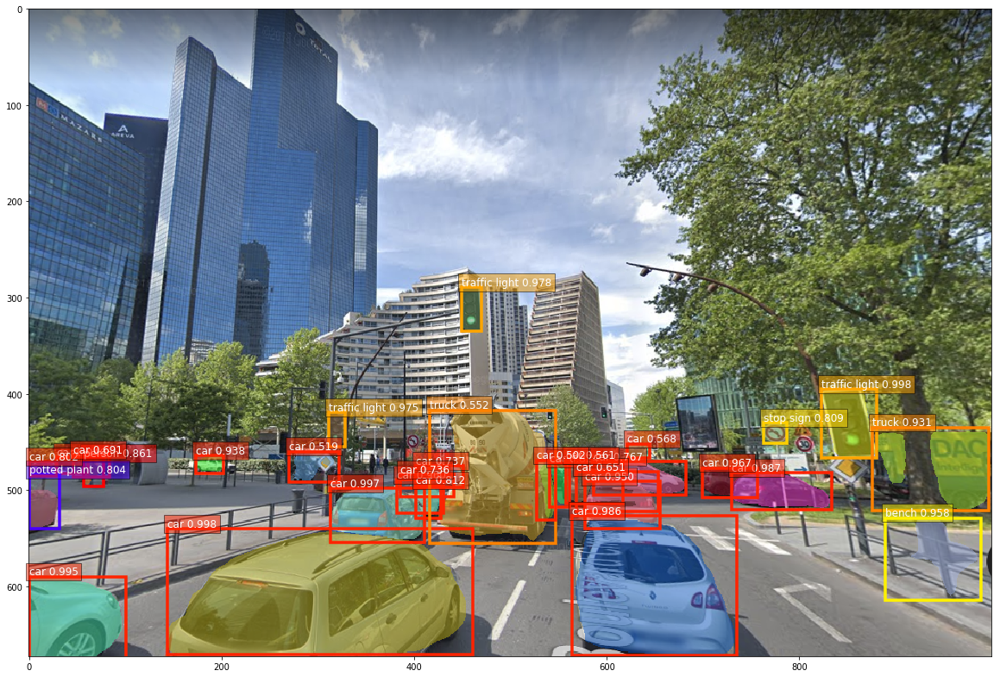

In [42]:
ids, scores, bboxes, masks = [xx[0].asnumpy() for xx in net(x.as_in_context(ctx))]

# paint segmentation mask on images directly
width, height = orig_img.shape[1], orig_img.shape[0]
masks = viz.expand_mask(masks, bboxes, (width, height), scores)
orig_img = viz.plot_mask(orig_img, masks)

# identical to Faster RCNN object detection
fig = plt.figure(figsize=(20, 20))
ax = fig.add_subplot(1, 1, 1)
ax = viz.plot_bbox(orig_img, bboxes, scores, ids,
                         class_names=net.classes, ax=ax)
plt.show()